# 87651260 Applications of Geographic Information System

# Linear Regression Demo
## Reference : Predicting House Prices with Linear Regression | Machine Learning from Scratch (Part II)
## Link : https://towardsdatascience.com/predicting-house-prices-with-linear-regression-machine-learning-from-scratch-part-ii-47a0238aeac1

## Attawut Nardkulpat, Reseach Officer, Burapha University
### attawut@buu.ac.th
### 07/08/2020

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib import rc
import unittest

%matplotlib inline

sns.set(style='whitegrid', palette='muted', font_scale=1.5)

#rcParams['figure.figsize'] = 14, 8

RANDOM_SEED = 123

np.random.seed(RANDOM_SEED)

# Load the data

Data [House Prices: Advanced Regression Techniques](https://www.kaggle.com/c/house-prices-advanced-regression-techniques)

In [2]:
df_train = pd.read_csv('house_prices_train.csv')
df_train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,lat,long
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,NaN,NaN,0,2,2008,WD,Normal,208500,47.5112,-122.257
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,NaN,NaN,0,5,2007,WD,Normal,181500,47.7210,-122.319
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,NaN,NaN,0,9,2008,WD,Normal,223500,47.7379,-122.233
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,NaN,NaN,0,2,2006,WD,Abnorml,140000,47.5208,-122.393
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,NaN,NaN,0,12,2008,WD,Normal,250000,47.6168,-122.045


In [6]:
df_train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

# Data exploration

In [3]:
df_train['SalePrice'].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

C:\Users\uSer\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


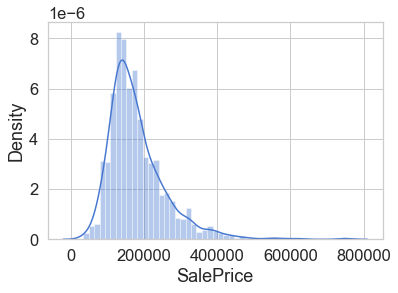

In [4]:
sns.distplot(df_train['SalePrice']);

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


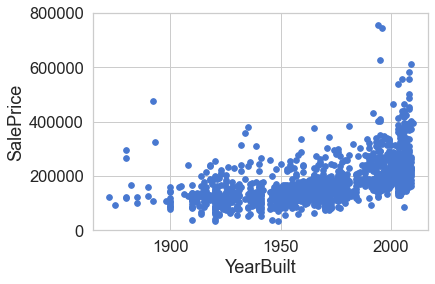

In [8]:
var = 'YearBuilt'
data = pd.concat([df_train['SalePrice'], df_train[var]], axis=1)
data.plot.scatter(x=var, y='SalePrice', ylim=(0,800000), s=32);

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


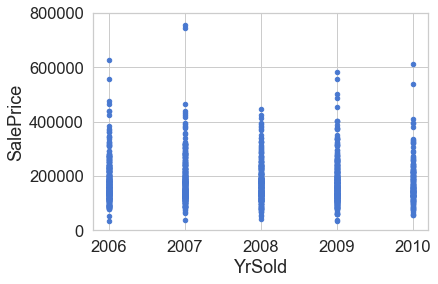

In [7]:
var = 'YrSold'
data = pd.concat([df_train['SalePrice'], df_train[var]], axis=1)
data.plot.scatter(x=var, y='SalePrice', ylim=(0,800000));

In [10]:
df_train['OverallQual']

0       7
1       6
2       7
3       7
4       8
       ..
1455    6
1456    6
1457    7
1458    5
1459    5
Name: OverallQual, Length: 1460, dtype: int64

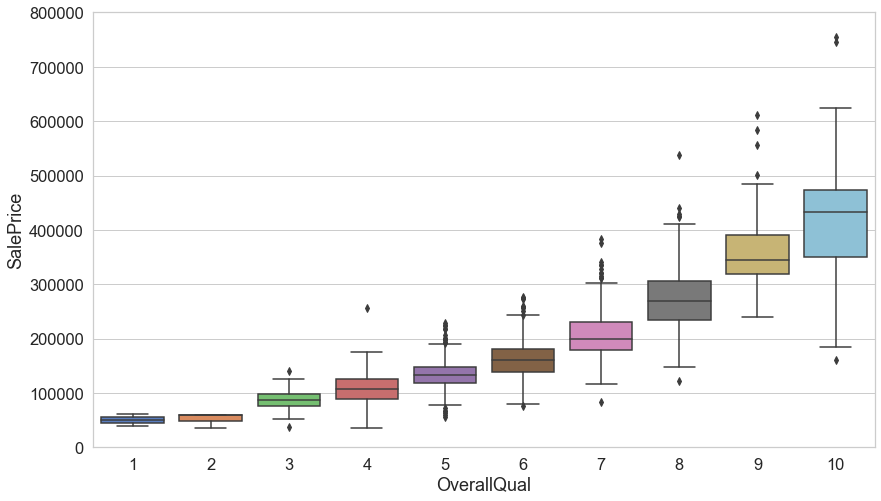

In [9]:
var = 'OverallQual'
data = pd.concat([df_train['SalePrice'], df_train[var]], axis=1)
f, ax = plt.subplots(figsize=(14, 8))
fig = sns.boxplot(x=var, y="SalePrice", data=data)
fig.axis(ymin=0, ymax=800000);

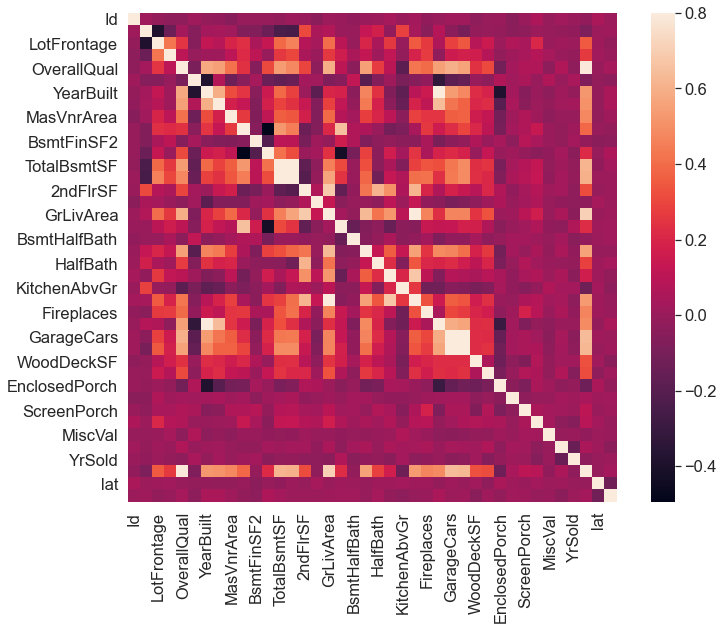

In [11]:
corrmat = df_train.corr()
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat, vmax=.8, square=True);

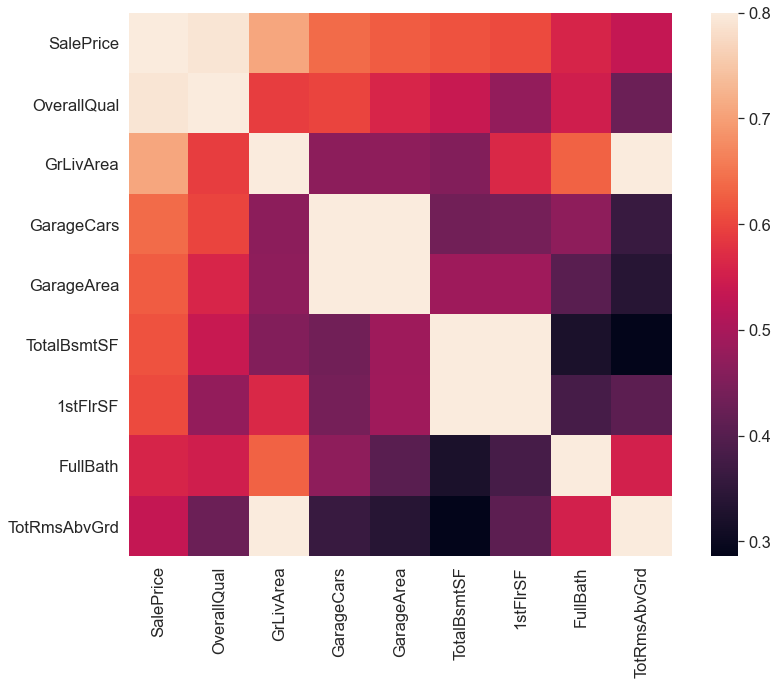

In [12]:
k = 9 #number of variables for heatmap
cols = corrmat.nlargest(k, 'SalePrice')['SalePrice'].index
f, ax = plt.subplots(figsize=(14, 10))
sns.heatmap(df_train[cols].corr(), vmax=.8, square=True);

C:\Users\uSer\anaconda3\lib\site-packages\seaborn\axisgrid.py:1969: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


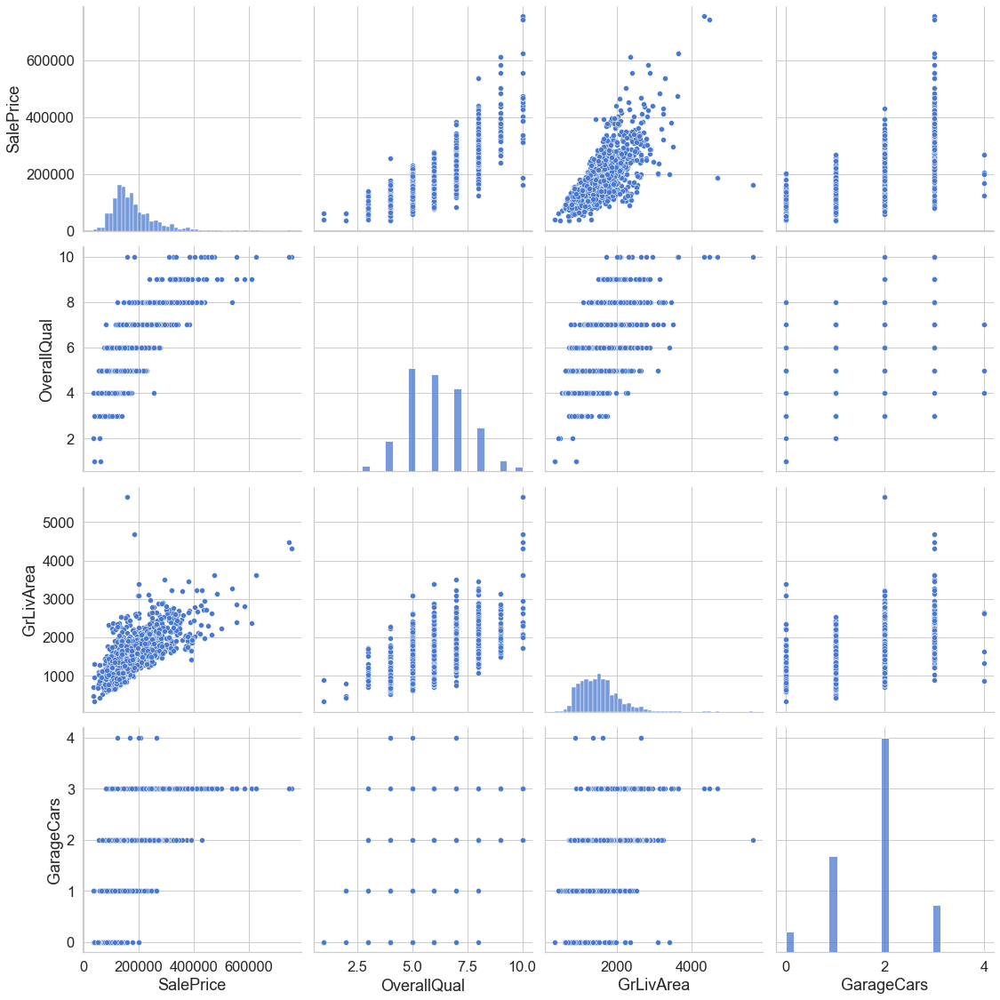

In [13]:
cols = ['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars']
sns.pairplot(df_train[cols], size = 4);

## Do we have missing data?

In [14]:
total = df_train.isnull().sum().sort_values(ascending=False)
percent = (df_train.isnull().sum()/df_train.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
PoolQC,1453,0.995205
MiscFeature,1406,0.963014
Alley,1369,0.937671
Fence,1179,0.807534
FireplaceQu,690,0.472603
LotFrontage,259,0.177397
GarageFinish,81,0.055479
GarageCond,81,0.055479
GarageYrBlt,81,0.055479
GarageQual,81,0.055479


# Predicting the sale price

## Preparing the data

### Feature scaling

We will do a little preprocessing to our data using the following formula (standardization):

$$x'= \frac{x - \mu}{\sigma}$$

where $\mu$ is the population mean and $\sigma$ is the standard deviation.

**Source: Andrew Ng**

In [15]:
x = df_train['GrLivArea']
y = df_train['SalePrice']

x = (x - x.mean()) / x.std()
x = np.c_[np.ones(x.shape[0]), x] 

In [16]:
x

array([[ 1.        ,  0.37020659],
       [ 1.        , -0.48234664],
       [ 1.        ,  0.51483616],
       ...,
       [ 1.        ,  1.56910958],
       [ 1.        , -0.83250243],
       [ 1.        , -0.49376477]])

In [17]:
x.shape

(1460, 2)

In [18]:
def loss(h, y):
  sq_error = (h - y)**2
  n = len(y)
  return 1.0 / (2*n) * sq_error.sum()

In [19]:
class LinearRegression:
  
  def predict(self, X):
    return np.dot(X, self._W)
  
  def _gradient_descent_step(self, X, targets, lr):

    predictions = self.predict(X)
    
    error = predictions - targets
    gradient = np.dot(X.T,  error) / len(X)

    self._W -= lr * gradient
      
  def fit(self, X, y, n_iter=1000, lr=0.01):

    self._W = np.zeros(X.shape[1])

    self._cost_history = []
    self._w_history = [self._W]
    for i in range(n_iter):
      
        prediction = self.predict(X)
        cost = loss(prediction, y)
        
        self._cost_history.append(cost)
        
        self._gradient_descent_step(x, y, lr)
        
        self._w_history.append(self._W.copy())
    return self

In [20]:
clf = LinearRegression()
clf.fit(x, y, n_iter=2000, lr=0.01)

In [21]:
y123 = clf.predict(x)

In [22]:
y123

array([201761.93931147, 153767.53858548, 209903.84657749, ...,
       269254.0653324 , 134055.55257302, 153124.7564329 ])

In [23]:
clf._W

array([180921.19555322,  56294.90199925])

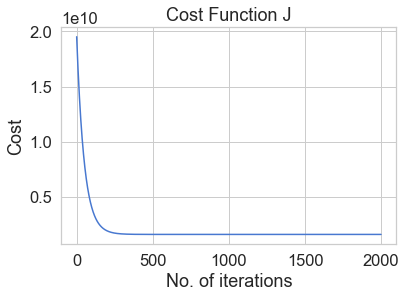

In [24]:
plt.title('Cost Function J')
plt.xlabel('No. of iterations')
plt.ylabel('Cost')
plt.plot(clf._cost_history)
plt.show()

In [25]:
clf._cost_history[-1]

1569921604.8332634

In [26]:
#Animation

#Set the plot up,
fig = plt.figure()
ax = plt.axes()
plt.title('Sale Price vs Living Area')
plt.xlabel('Living Area in square feet (normalised)')
plt.ylabel('Sale Price ($)')
plt.scatter(x[:,1], y)
line, = ax.plot([], [], lw=2, color='red')
annotation = ax.text(-1, 700000, '')
annotation.set_animated(True)
plt.close()

#Generate the animation data,
def init():
    line.set_data([], [])
    annotation.set_text('')
    return line, annotation

# animation function.  This is called sequentially
def animate(i):
    x = np.linspace(-5, 20, 1000)
    y = clf._w_history[i][1]*x + clf._w_history[i][0]
    line.set_data(x, y)
    annotation.set_text('Cost = %.2f e10' % (clf._cost_history[i]/10000000000))
    return line, annotation

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=300, interval=10, blit=True)

rc('animation', html='jshtml')

anim

# Predict

In [29]:
df_test = pd.read_csv('house_prices_test.csv')
df_test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,lat,long
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,NaN,NaN,0,2,2008,WD,Normal,NaN,47.5112,-122.257
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,NaN,NaN,0,5,2007,WD,Normal,NaN,47.7210,-122.319
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,NaN,NaN,0,9,2008,WD,Normal,NaN,47.7379,-122.233
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,NaN,NaN,0,2,2006,WD,Abnorml,NaN,47.5208,-122.393
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,NaN,NaN,0,12,2008,WD,Normal,NaN,47.6168,-122.045


In [30]:
total_test = df_test.isnull().sum().sort_values(ascending=False)
percent_test = (df_test.isnull().sum()/df_test.isnull().count()).sort_values(ascending=False)
missing_data_test = pd.concat([total_test, percent_test], axis=1, keys=['Total', 'Percent'])
missing_data_test.head(20)

,Total,Percent
SalePrice,462,1.000000
PoolQC,461,0.997835
MiscFeature,444,0.961039
Alley,433,0.937229
Fence,371,0.803030
FireplaceQu,216,0.467532
LotFrontage,82,0.177489
GarageQual,27,0.058442
GarageCond,27,0.058442
GarageType,27,0.058442


In [31]:
x_test = df_test['GrLivArea']
y_test = df_test['SalePrice']

x_test = (x_test - x_test.mean()) / x_test.std()
x_test = np.c_[np.ones(x_test.shape[0]), x_test] 

In [32]:
x_test

array([[ 1.        ,  0.38503743],
       [ 1.        , -0.52078676],
       [ 1.        ,  0.53870403],
       [ 1.        ,  0.39919093],
       [ 1.        ,  1.37173878],
       [ 1.        , -0.31859386],
       [ 1.        ,  0.35268656],
       [ 1.        ,  1.15337045],
       [ 1.        ,  0.51444088],
       [ 1.        , -0.89484363],
       [ 1.        , -0.969655  ],
       [ 1.        ,  1.62650183],
       [ 1.        , -1.22846192],
       [ 1.        , -0.05169924],
       [ 1.        , -0.53898413],
       [ 1.        , -1.3457338 ],
       [ 1.        , -1.04244445],
       [ 1.        , -0.45204118],
       [ 1.        , -0.82003226],
       [ 1.        , -0.36509823],
       [ 1.        ,  1.73164214],
       [ 1.        , -0.83216383],
       [ 1.        ,  0.55690139],
       [ 1.        , -0.92921642],
       [ 1.        , -0.92921642],
       [ 1.        ,  0.16262524],
       [ 1.        , -1.25272506],
       [ 1.        ,  0.37290585],
       [ 1.        ,

In [33]:
y_test = clf.predict(x_test)

In [34]:
y_test

array([202596.83981522, 151603.55565909, 211247.48623456, 203393.60988016,
       258143.09577101, 162985.98515823, 200775.65109536, 245850.07191194,
       209881.59469467, 130546.06108569, 126334.56217101, 272484.95693992,
       111765.05241211, 178010.79209709, 150579.13700417, 105163.24330261,
       122236.88755132, 155473.5816888 , 134757.56000037, 160368.02637342,
       278403.82027947, 134074.61423042, 212271.90488949, 128611.04807083,
       128611.04807083, 190076.16736617, 110399.16087221, 201913.89404527,
       190076.16736617,  67145.92877549, 157863.89188361, 147733.52962938,
       148416.47539933, 201458.59686531, 185637.01986151, 287054.46669882,
       132822.54698551, 155587.40598379, 128269.57518586, 139082.88321004,
       158660.66194855, 159115.95912852, 108577.97215235, 114724.48408189,
       138855.23462006, 207377.46020486, 252565.70531643, 196450.32788569,
       173230.17170745, 116659.49709674, 175279.00901729, 141814.66628983,
       100837.92009294, 2

In [35]:
y_test = pd.DataFrame(y_test)

In [36]:
y_test

,0
0,202596.839815
1,151603.555659
2,211247.486235
3,203393.609880
4,258143.095771
...,...
457,197247.097951
458,197588.570836
459,144887.922255
460,228207.306188


In [37]:
y_test["SalePrice"] = y_test[0]

In [39]:
y_test

,0,SalePrice
0,202596.839815,202596.839815
1,151603.555659,151603.555659
2,211247.486235,211247.486235
3,203393.609880,203393.609880
4,258143.095771,258143.095771
...,...,...
457,197247.097951,197247.097951
458,197588.570836,197588.570836
459,144887.922255,144887.922255
460,228207.306188,228207.306188


# Join Data

In [40]:
result = pd.merge(df_test, y_test['SalePrice'], left_index=True,right_index=True)

In [41]:
result 

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice_x,lat,long,SalePrice_y
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,NaN,0,2,2008,WD,Normal,NaN,47.5112,-122.257,202596.839815
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,NaN,0,5,2007,WD,Normal,NaN,47.7210,-122.319,151603.555659
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,NaN,0,9,2008,WD,Normal,NaN,47.7379,-122.233,211247.486235
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,NaN,0,2,2006,WD,Abnorml,NaN,47.5208,-122.393,203393.609880
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,NaN,0,12,2008,WD,Normal,NaN,47.6168,-122.045,258143.095771
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
457,458,20,RL,NaN,53227,Pave,NaN,IR1,Low,AllPub,...,NaN,0,3,2008,WD,Normal,NaN,47.3844,-122.438,197247.097951
458,459,70,RM,NaN,5100,Pave,Grvl,Reg,Lvl,AllPub,...,NaN,0,6,2008,WD,Normal,NaN,47.4904,-122.226,197588.570836
459,460,50,RL,NaN,7015,Pave,NaN,IR1,Bnk,AllPub,...,NaN,0,7,2009,WD,Normal,NaN,47.3663,-122.089,144887.922255
460,461,60,FV,75.0,8004,Pave,NaN,IR1,Lvl,AllPub,...,NaN,0,12,2009,New,Partial,NaN,47.5637,-122.123,228207.306188


# Multivariable Linear Regression

Let's use more of the available data to build a Multivariable Linear Regression model and see whether or not that will improve our OHMSE error:

In [42]:
x = df_train[['OverallQual', 'GrLivArea', 'GarageCars']]

x = (x - x.mean()) / x.std()
x = np.c_[np.ones(x.shape[0]), x] 

clf = LinearRegression()
clf.fit(x, y, n_iter=2000, lr=0.01)

In [43]:
clf._W

array([180921.19555322,  37478.604254  ,  26631.93830568,  15921.22581327])

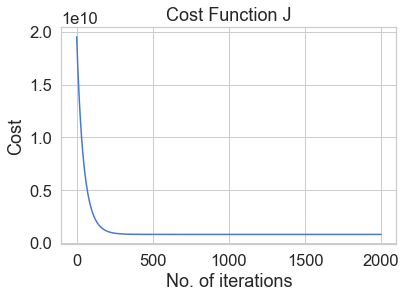

In [44]:
plt.title('Cost Function J')
plt.xlabel('No. of iterations')
plt.ylabel('Cost')
plt.plot(clf._cost_history)
plt.show()

In [45]:
clf._cost_history[-1]

822817042.8437101

# Display Map

In [48]:
!pip install ipyleaflet
!pip install ipywidgets

In [46]:
from ipyleaflet import Map, Marker, MarkerCluster
from ipywidgets import Text, HTML

longitudes = df_train['long'].values.tolist()
latitudes = df_train['lat'].values.tolist()

markers = []

for lon,lat in zip(longitudes, latitudes):
    markers.append(Marker(location=(lat, lon)))

m = Map(center=(latitudes[0], longitudes[0]), zoom=10)

marker_cluster = MarkerCluster(
    markers=markers
)

m.add_layer(marker_cluster);

In [47]:
m

Map(center=[47.5112, -122.257], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'z…